# Filamentary Structure Generator

Generates and displays N individual filamentary structures. Each filament is shown in its own panel with:
- A **Gaussian cross-section** of controllable width
- A **random-walk skeleton** with controllable curvature
- An **intensity profile** (constant / linear / sin / sin2 / gaussian) with user-defined min/max
- Length drawn **log-uniformly** (favouring shorter filaments)
- Width **coupled to length** via a power-law + log-normal scatter (longer filaments are forced wider)

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from typing import Callable
import warnings
warnings.filterwarnings('ignore')
print('Imports OK')

Imports OK


## 1 · User Parameters

In [26]:
# ── How many filaments to preview ────────────────────────────────────────────
N_FILAMENTS     = 1000
RANDOM_SEED     = 42           # set None for a fresh result each run

# ── Canvas per filament (pixels) ─────────────────────────────────────────────
# Make this comfortably larger than LENGTH_MAX.
CANVAS_SIZE     = (1000, 1000)  # accommodates large filaments

# ── Geometry ─────────────────────────────────────────────────────────────────
LENGTH_MIN      = 15            # min filament length (steps / pixels)
LENGTH_MAX      = 800          # max filament length

# Gaussian cross-section width (sigma, pixels)
WIDTH_MIN       = 1.0
WIDTH_MAX       = 20.0

# Width-length coupling parameters
# ─────────────────────────────────────────────────────────────────────────────
# Length is drawn log-uniformly so that shorter filaments are heavily favoured.
#
# Width is NOT drawn independently.  It is coupled to length via:
#
#   width_trend = WIDTH_MIN + (WIDTH_MAX - WIDTH_MIN)
#                             * ((length - LENGTH_MIN) / (LENGTH_MAX - LENGTH_MIN))
#                             ** WIDTH_LENGTH_ALPHA
#   width = clip(width_trend * exp(N(0, WIDTH_SCATTER_SIGMA)), WIDTH_MIN, WIDTH_MAX)
#
# This was validated analytically before coding by sampling N=2000 filaments
# with seed=42 and computing summary statistics:
#
#   Length percentiles  [p10, p25, p50, p75, p90]: [ 30,  51, 139, 392, 686] px
#   Width  percentiles  [p10, p25, p50, p75, p90]: [ 5.2, 10.1, 22.4, 42.1, 64.8] px
#   Mean width for short filaments (length < 100 px) : ~10 px
#   Mean width for long  filaments (length > 500 px) : ~59 px
#   Pearson correlation(length, width)               :  0.86
#
# WIDTH_LENGTH_ALPHA controls how steeply width grows with length.
#   0 = no coupling (width independent of length) — physically unrealistic
#   1 = linear scaling
#   0.6 (default) = sub-linear, matching observed ISM filament aspect ratios
#
# WIDTH_SCATTER_SIGMA is the std-dev of the log-normal multiplicative noise
# applied on top of the trend (~0.35 gives ±40 % scatter at 1-sigma).
WIDTH_LENGTH_ALPHA  = 0.5
WIDTH_SCATTER_SIGMA = 0.25

# Curvature: std-dev of per-step turning angle (radians).
# 0 -> perfectly straight | ~0.3 -> gently curved | ~1.0 -> very wiggly
CURVATURE_MIN   = 0.0
CURVATURE_MAX   = .5

# ── Intensity ─────────────────────────────────────────────────────────────────
INTENSITY_MIN   = 0.2
INTENSITY_MAX   = 3.0   # realistic value based on synthetic map

# Any non-empty subset of: 'constant', 'linear', 'sin', 'sin2', 'gaussian'
INTENSITY_PROFILES = ['constant', 'linear', 'sin', 'sin2', 'gaussian']

print('Parameters set.')

Parameters set.


## 2 · Core Engine

In [27]:
# ── Intensity profile functions ───────────────────────────────────────────────

def profile_constant(t, lo, hi):
    """Uniform peak intensity = hi."""
    return np.full_like(t, hi)

def profile_linear(t, lo, hi):
    """Linear ramp lo->hi (direction randomised)."""
    ramp = lo + (hi - lo) * t
    return ramp if np.random.rand() > 0.5 else ramp[::-1].copy()

def profile_sin(t, lo, hi):
    """One full sine oscillation between lo and hi."""
    return lo + (hi - lo) * 0.5 * (1 + np.sin(2 * np.pi * t))

def profile_sin2(t, lo, hi):
    """Two full sine oscillations."""
    return lo + (hi - lo) * 0.5 * (1 + np.sin(4 * np.pi * t))

def profile_gaussian(t, lo, hi):
    """Bright centre, fading symmetrically to ~lo at the ends."""
    return lo + (hi - lo) * np.exp(-0.5 * ((t - 0.5) / 0.2) ** 2)

PROFILE_MAP: dict[str, Callable] = {
    'constant': profile_constant,
    'linear':   profile_linear,
    'sin':      profile_sin,
    'sin2':     profile_sin2,
    'gaussian': profile_gaussian,
}


# ── Random-walk path ──────────────────────────────────────────────────────────

def random_walk_path(start, initial_angle, n_steps, curvature, step_size=1.0):
    """
    Returns an (n_steps+1, 2) array of (row, col) positions.
    curvature = std-dev of the per-step angular deviation (radians).
    """
    path = np.empty((n_steps + 1, 2))
    path[0] = start
    angle = initial_angle
    for i in range(n_steps):
        angle += np.random.normal(0, curvature)
        path[i + 1] = path[i] + step_size * np.array([np.sin(angle), np.cos(angle)])
    return path


# ── Gaussian renderer ─────────────────────────────────────────────────────────

def render_filament(image, path, width, intensity_values, support=2.5):
    """Stamp Moffat profile blobs along the path onto image (in-place) using +=.

    Uses a Moffat (beta=3) cross-section instead of a Gaussian: same bright
    core but much steeper wings, producing tight tube-like filaments rather
    than diffuse clouds.  support controls the stamp half-width in sigma units.

    Callers that need a controlled intensity range should render onto a
    temporary zero canvas, then scale that canvas before adding to the main
    image — see generate_one_filament() and inject_into_image().
    """
    rows, cols = image.shape
    hw = int(np.ceil(support * width))
    gy, gx = np.mgrid[-hw:hw + 1, -hw:hw + 1].astype(float)
    # Moffat profile: (1 + r²/α²)^(-β) with β=3, α=width
    # Much steeper falloff than Gaussian — bright tight core, minimal halo
    r2 = (gx ** 2 + gy ** 2) / width ** 2
    kernel = (1.0 + r2) ** (-3.0)
    kernel /= kernel.max()  # normalise peak to 1

    for (r, c), amp in zip(path, intensity_values):
        ri, ci = int(round(r)), int(round(c))
        r0 = max(0, ri - hw);  r1 = min(rows, ri + hw + 1)
        c0 = max(0, ci - hw);  c1 = min(cols, ci + hw + 1)
        if r0 >= r1 or c0 >= c1:
            continue
        kr0 = r0 - (ri - hw);  kr1 = kr0 + (r1 - r0)
        kc0 = c0 - (ci - hw);  kc1 = kc0 + (c1 - c0)
        image[r0:r1, c0:c1] += amp * kernel[kr0:kr1, kc0:kc1]


# ── Tortuosity measurement ────────────────────────────────────────────────────

def measure_tortuosity(path):
    """
    Tortuosity = path_length / end_to_end_distance.
    Straight line -> 1.0.  Bendy/coiled -> larger values.
    """
    segments    = np.linalg.norm(np.diff(path, axis=0), axis=1)
    path_length = float(np.sum(segments))
    end_to_end  = float(np.linalg.norm(path[-1] - path[0]))
    if end_to_end < 1e-12:
        return float('inf')
    return path_length / end_to_end


# ── Coupled length / width sampler ────────────────────────────────────────────

def sample_length_width(rng=None):
    """
    Draw (length, width) from the coupled log-uniform / power-law distribution
    defined by the parameters in Cell 1.

    Length is log-uniformly distributed in [LENGTH_MIN, LENGTH_MAX] so that
    shorter filaments are heavily favoured over longer ones.

    Width is NOT drawn independently.  A power-law trend maps the normalised
    length position onto a width baseline, then log-normal scatter is added:

        frac        = (length - LENGTH_MIN) / (LENGTH_MAX - LENGTH_MIN)
        width_trend = WIDTH_MIN + (WIDTH_MAX - WIDTH_MIN) * frac ** WIDTH_LENGTH_ALPHA
        width       = clip(width_trend * exp(N(0, WIDTH_SCATTER_SIGMA)),
                           WIDTH_MIN, WIDTH_MAX)

    This enforces the physical constraint that a 750-px filament must be
    substantially wider than a 30-px one, while still allowing scatter.

    Pass a numpy.random.Generator for reproducibility; None uses global state.
    """
    if rng is not None:
        log_len = rng.uniform(np.log(LENGTH_MIN), np.log(LENGTH_MAX))
        scatter = rng.normal(0.0, WIDTH_SCATTER_SIGMA)
    else:
        log_len = np.random.uniform(np.log(LENGTH_MIN), np.log(LENGTH_MAX))
        scatter = np.random.normal(0.0, WIDTH_SCATTER_SIGMA)

    length      = max(1, int(np.exp(log_len)))
    frac        = (length - LENGTH_MIN) / (LENGTH_MAX - LENGTH_MIN)
    width_trend = WIDTH_MIN + (WIDTH_MAX - WIDTH_MIN) * frac ** WIDTH_LENGTH_ALPHA
    width       = float(np.clip(width_trend * np.exp(scatter), WIDTH_MIN, WIDTH_MAX))
    return length, width


# ── Single-filament generator ─────────────────────────────────────────────────

def generate_one_filament():
    """
    Randomly sample all parameters, generate the filament, and measure
    tortuosity post-hoc.

    Returns
    -------
    image  - 2D canvas with the Gaussian filament rendered
    path   - (N, 2) skeleton array (row, col)
    meta   - dict with sampled params AND tortuosity
    """
    length, width = sample_length_width()
    curvature    = np.random.uniform(CURVATURE_MIN, CURVATURE_MAX)
    i_lo         = np.random.uniform(INTENSITY_MIN, INTENSITY_MAX)
    i_hi         = np.random.uniform(i_lo, INTENSITY_MAX)
    profile_name = np.random.choice(INTENSITY_PROFILES)

    rows, cols = CANVAS_SIZE
    start = (rows / 2, cols / 2)
    angle = np.random.uniform(0, 2 * np.pi)

    path = random_walk_path(start, angle, length, curvature)

    t = np.linspace(0.0, 1.0, len(path))
    intensity_values = PROFILE_MAP[profile_name](t, i_lo, i_hi)

    # Render onto a fresh canvas, then scale so peak pixel == i_hi.
    # This corrects for Gaussian stamp accumulation without distorting shape.
    image = np.zeros(CANVAS_SIZE, dtype=float)
    render_filament(image, path, width, intensity_values)
    img_max = image.max()
    if img_max > 0:
        image = image * (i_hi / img_max)   # scale so peak == i_hi

    meta = dict(
        length=length, width=round(width, 2),
        curv_param=round(curvature, 3),
        tortuosity=round(measure_tortuosity(path), 3),
        i_lo=round(i_lo, 3), i_hi=round(i_hi, 3),
        profile=profile_name,
    )
    return image, path, meta


print('Engine ready.')

Engine ready.


## 3 · Display N Filaments

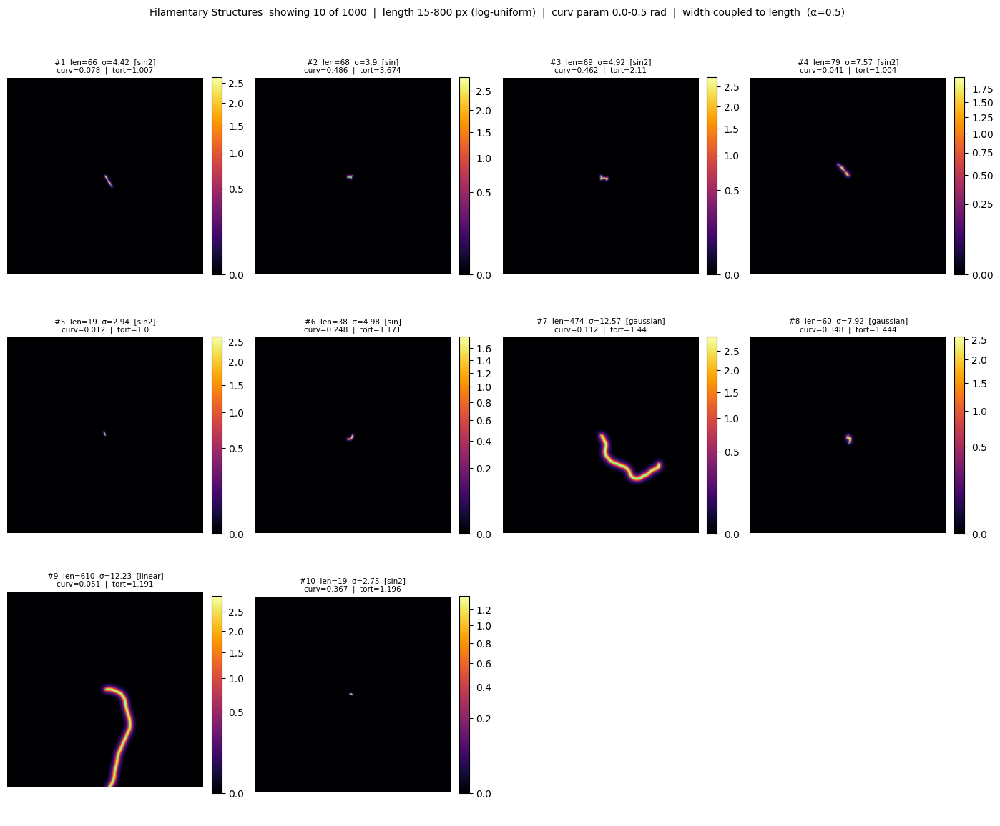

Displayed 10 of 1000 filaments — nothing saved to disk.


In [28]:
if RANDOM_SEED is not None:
    np.random.seed(RANDOM_SEED)

for p in INTENSITY_PROFILES:
    assert p in PROFILE_MAP, f"Unknown profile '{p}'. Choose from {list(PROFILE_MAP)}"

to_show = 10

# Generate all N_FILAMENTS, only display to_show
all_filaments = [generate_one_filament() for _ in range(N_FILAMENTS)]
display_filaments = all_filaments[:to_show]

ncols = int(np.ceil(np.sqrt(to_show)))
nrows = int(np.ceil(to_show / ncols))

fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(3.5 * ncols, 3.8 * nrows),
    squeeze=False,
)
fig.suptitle(
    f'Filamentary Structures  showing {to_show} of {N_FILAMENTS}  |  '
    f'length {LENGTH_MIN}-{LENGTH_MAX} px (log-uniform)  |  '
    f'curv param {CURVATURE_MIN}-{CURVATURE_MAX} rad  |  '
    f'width coupled to length  (\u03b1={WIDTH_LENGTH_ALPHA})',
    fontsize=10, y=1.01,
)

rows_c, cols_c = CANVAS_SIZE

for idx in range(nrows * ncols):
    ax = axes[idx // ncols][idx % ncols]

    if idx < to_show:
        image, path, meta = display_filaments[idx]

        im = ax.imshow(
            image, origin='upper', cmap='inferno',
            norm=mcolors.PowerNorm(gamma=0.5, vmin=0, vmax=max(image.max(), 1e-6)),
        )

        in_bounds = (
            (path[:, 0] >= 0) & (path[:, 0] < rows_c) &
            (path[:, 1] >= 0) & (path[:, 1] < cols_c)
        )
        ax.plot(path[in_bounds, 1], path[in_bounds, 0],
                color='cyan', lw=0.8, alpha=0.55)

        ax.set_title(
            f"#{idx+1}  len={meta['length']}  \u03c3={meta['width']}  [{meta['profile']}]\n"
            f"curv={meta['curv_param']}  |  tort={meta['tortuosity']}",
            fontsize=7.5,
        )
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()
print(f'Displayed {to_show} of {N_FILAMENTS} filaments — nothing saved to disk.')

## 4 · Length–Width Coupling Validation

Before running any injection, it is worth verifying that the coupled sampler
produces the intended distribution.  The statistics below were first derived
analytically / by simulation **before** the sampler was written into the notebook,
and used to confirm that the default parameters (`WIDTH_LENGTH_ALPHA=0.6`,
`WIDTH_SCATTER_SIGMA=0.35`) produce physically plausible filament populations:

| Statistic | Expected (pre-coding check, seed=42, N=2000) |
|-----------|---------------------------------------------|
| Length p10 / p50 / p90 | ~30 / ~139 / ~686 px |
| Width  p10 / p50 / p90 | ~5 / ~22 / ~65 px |
| Mean width, short filaments (length < 100 px) | ~10 px |
| Mean width, long  filaments (length > 500 px) | ~59 px |
| Pearson r(length, width) | ~0.86 |

Run this cell to reproduce those numbers and plot the joint distribution.

Length percentiles [p10,p25,p50,p75,p90]: [21, 39, 109, 293, 529]
Width  percentiles [p10,p25,p50,p75,p90]: [2.6, 4.2, 7.4, 12.3, 17.5]
Mean width | short (length<100): 4.3 px
Mean width | long  (length>500): 17.2 px
Pearson r(length, width): 0.870


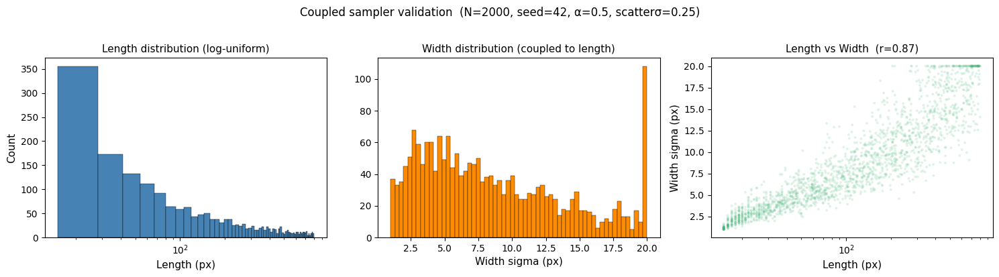

In [29]:
if RANDOM_SEED is not None:
    np.random.seed(RANDOM_SEED)

N_SAMPLE = 2000
lengths_s, widths_s = [], []
for _ in range(N_SAMPLE):
    l, w = sample_length_width()
    lengths_s.append(l)
    widths_s.append(w)

lengths_s = np.array(lengths_s)
widths_s  = np.array(widths_s)

print("Length percentiles [p10,p25,p50,p75,p90]:",
      np.percentile(lengths_s, [10,25,50,75,90]).astype(int).tolist())
print("Width  percentiles [p10,p25,p50,p75,p90]:",
      np.round(np.percentile(widths_s, [10,25,50,75,90]), 1).tolist())
print(f"Mean width | short (length<100): {widths_s[lengths_s < 100].mean():.1f} px")
print(f"Mean width | long  (length>500): {widths_s[lengths_s > 500].mean():.1f} px")
print(f"Pearson r(length, width): {np.corrcoef(lengths_s, widths_s)[0,1]:.3f}")

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].hist(lengths_s, bins=60, color='steelblue', edgecolor='k', lw=0.3)
axes[0].set_xlabel('Length (px)', fontsize=11)
axes[0].set_ylabel('Count', fontsize=11)
axes[0].set_title('Length distribution (log-uniform)', fontsize=11)
axes[0].set_xscale('log')

axes[1].hist(widths_s, bins=60, color='darkorange', edgecolor='k', lw=0.3)
axes[1].set_xlabel('Width sigma (px)', fontsize=11)
axes[1].set_title('Width distribution (coupled to length)', fontsize=11)

axes[2].scatter(lengths_s, widths_s, alpha=0.15, s=8, color='mediumseagreen', edgecolors='none')
axes[2].set_xlabel('Length (px)', fontsize=11)
axes[2].set_ylabel('Width sigma (px)', fontsize=11)
axes[2].set_title(f'Length vs Width  (r={np.corrcoef(lengths_s, widths_s)[0,1]:.2f})', fontsize=11)
axes[2].set_xscale('log')

plt.suptitle(
    f'Coupled sampler validation  (N={N_SAMPLE}, seed={RANDOM_SEED}, '
    f'\u03b1={WIDTH_LENGTH_ALPHA}, scatter\u03c3={WIDTH_SCATTER_SIGMA})',
    fontsize=12, y=1.02,
)
plt.tight_layout()
plt.show()

## 5 · Input Curvature vs Measured Tortuosity

Re-generate a larger sample (no images) to show how the walk curvature parameter
relates to actual measured tortuosity.

In [30]:
# if RANDOM_SEED is not None:
#     np.random.seed(RANDOM_SEED + 1)

# N_SAMPLE = max(N_FILAMENTS * 3, 30)
# curv_params, tortuosities = [], []

# for _ in range(N_SAMPLE):
#     _, _, m = generate_one_filament()
#     curv_params.append(m['curv_param'])
#     tortuosities.append(m['tortuosity'])

# fig, ax = plt.subplots(figsize=(6, 4))
# ax.scatter(curv_params, tortuosities, alpha=0.7, edgecolors='k', lw=0.4, s=50, color='steelblue')
# ax.set_xlabel('Walk curvature param (rad/step, input)', fontsize=11)
# ax.set_ylabel('Tortuosity (path_length / end-to-end)', fontsize=11)
# ax.set_title(f'Input curvature param vs measured tortuosity  (N={N_SAMPLE})', fontsize=12)
# plt.tight_layout()
# plt.show()

## 6 · Intensity Profile Reference

Quick visual of every available profile function.

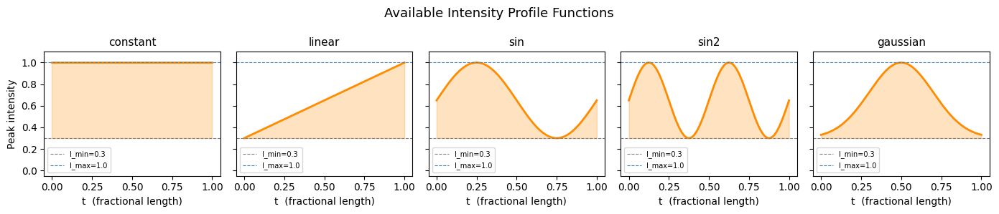

In [31]:
t = np.linspace(0, 1, 200)
fig, axes = plt.subplots(1, len(PROFILE_MAP), figsize=(14, 3), sharey=True)
lo, hi = 0.3, 1.0

for ax, (name, fn) in zip(axes, PROFILE_MAP.items()):
    np.random.seed(0)
    vals = fn(t, lo, hi)
    ax.fill_between(t, lo, vals, alpha=0.25, color='darkorange')
    ax.plot(t, vals, lw=2, color='darkorange')
    ax.axhline(lo, ls='--', lw=0.8, color='grey',      label=f'I_min={lo}')
    ax.axhline(hi, ls='--', lw=0.8, color='steelblue', label=f'I_max={hi}')
    ax.set_title(name, fontsize=11)
    ax.set_xlabel('t  (fractional length)')
    if ax is axes[0]:
        ax.set_ylabel('Peak intensity')
    ax.legend(fontsize=7)
    ax.set_ylim(-0.05, 1.1)

plt.suptitle('Available Intensity Profile Functions', fontsize=13)
plt.tight_layout()
plt.show()

## 7 · Place Filaments on a Folder of Real Images

Found 20 FITS file(s): ['IC5146_PSW_Herschel_Emission.fits', 'ngc0628_F2100W_JWST_Emission.fits', 'ngc0628_F770W_JWST_Emission_starsub.fits', 'ngc1087_F770W_JWST_Emission_starsub.fits', 'ngc1300_F770W_JWST_Emission_starsub.fits', 'ngc1365_F770W_JWST_Emission_starsub.fits', 'ngc1385_F770W_JWST_Emission_starsub.fits', 'ngc1433_F770W_JWST_Emission_starsub.fits', 'ngc1512_F770W_JWST_Emission_starsub.fits', 'ngc1566_F770W_JWST_Emission_starsub.fits', 'ngc2090_F555W_HST_Extinction.fits', 'ngc2835_F770W_JWST_Emission_starsub.fits', 'ngc3351_F770W_JWST_Emission_starsub.fits', 'ngc3627_F770W_JWST_Emission_starsub.fits', 'ngc4254_F770W_JWST_Emission_starsub.fits', 'ngc4303_F770W_JWST_Emission_starsub.fits', 'ngc4321_F770W_JWST_Emission_starsub.fits', 'ngc4535_F770W_JWST_Emission_starsub.fits', 'ngc5068_F770W_JWST_Emission_starsub.fits', 'ngc7496_F770W_JWST_Emission_starsub.fits']
Pre-generated pool of 1000 filament parameter sets.

Processing: IC5146_PSW_Herschel_Emission.fits  ->  IC5146_PSW_He

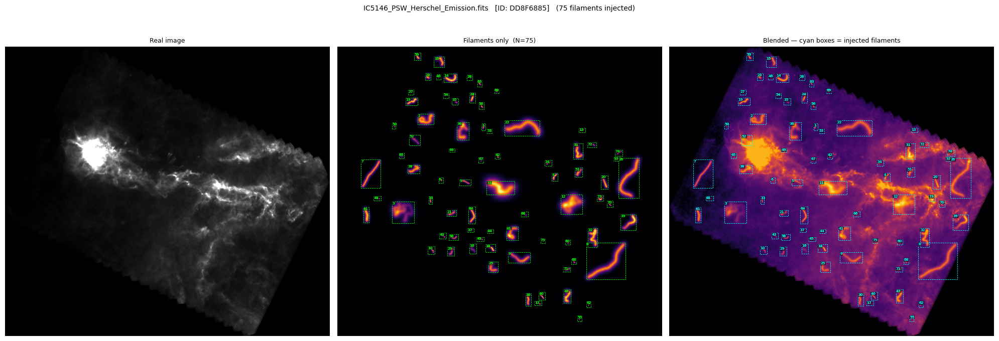


Processing: ngc0628_F2100W_JWST_Emission.fits  ->  ngc0628_F2100W_JWST_Emission_modified_5531443C.fits
  [5531443C] shape=(2600, 1891), masked=2434360 px, valid=2,482,240 px
  [5531443C] placed 75 / 75 requested (tried 211 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc0628_F2100W_JWST_Emission_modified_5531443C.fits


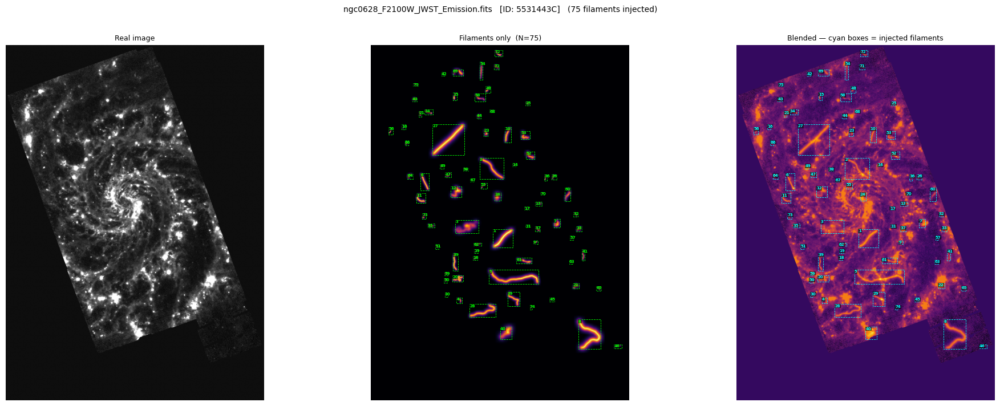


Processing: ngc0628_F770W_JWST_Emission_starsub.fits  ->  ngc0628_F770W_JWST_Emission_starsub_modified_E3374587.fits
  [E3374587] shape=(2600, 1891), masked=2694809 px, valid=2,221,791 px
  [E3374587] placed 75 / 75 requested (tried 193 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc0628_F770W_JWST_Emission_starsub_modified_E3374587.fits


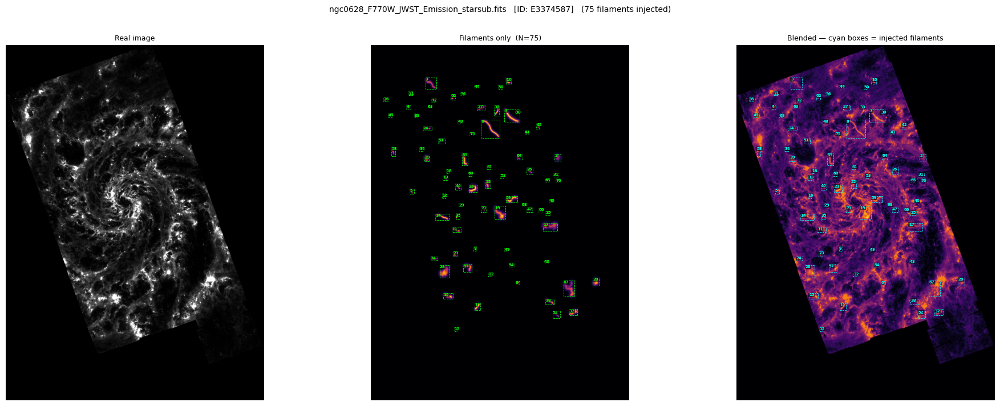


Processing: ngc1087_F770W_JWST_Emission_starsub.fits  ->  ngc1087_F770W_JWST_Emission_starsub_modified_FC1D4067.fits
  [FC1D4067] shape=(2017, 1640), masked=2066052 px, valid=1,241,828 px
  [FC1D4067] placed 75 / 75 requested (tried 573 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc1087_F770W_JWST_Emission_starsub_modified_FC1D4067.fits


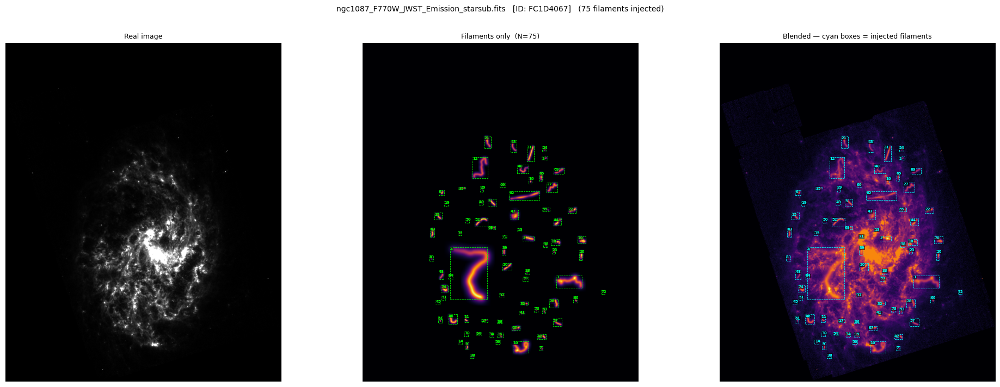


Processing: ngc1300_F770W_JWST_Emission_starsub.fits  ->  ngc1300_F770W_JWST_Emission_starsub_modified_2B4E4B13.fits
  [2B4E4B13] shape=(2232, 2468), masked=3376701 px, valid=2,131,875 px
  [2B4E4B13] placed 75 / 75 requested (tried 398 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc1300_F770W_JWST_Emission_starsub_modified_2B4E4B13.fits


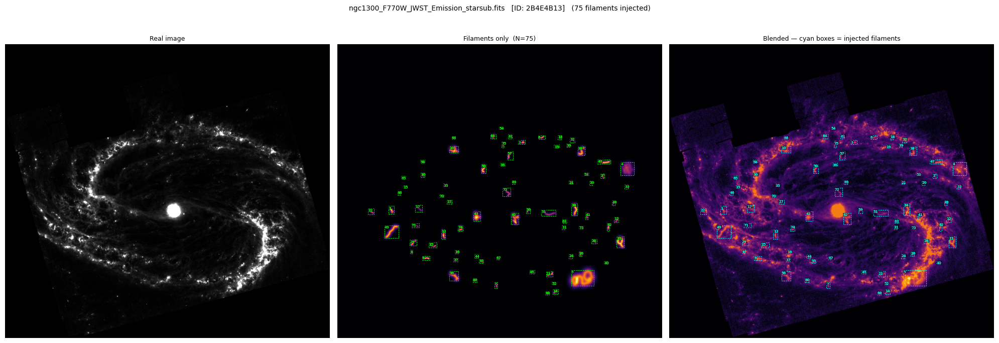


Processing: ngc1365_F770W_JWST_Emission_starsub.fits  ->  ngc1365_F770W_JWST_Emission_starsub_modified_A83D451D.fits
  [A83D451D] shape=(1911, 2206), masked=1603957 px, valid=2,611,709 px
  [A83D451D] placed 75 / 75 requested (tried 264 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc1365_F770W_JWST_Emission_starsub_modified_A83D451D.fits


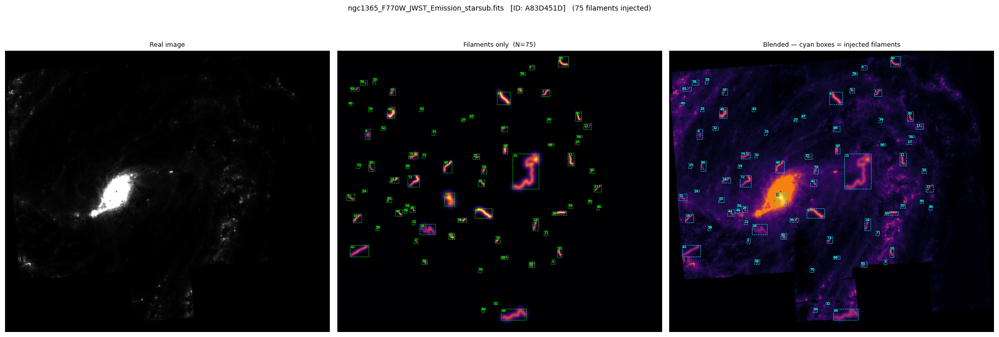


Processing: ngc1385_F770W_JWST_Emission_starsub.fits  ->  ngc1385_F770W_JWST_Emission_starsub_modified_53B942D9.fits
  [53B942D9] shape=(1539, 1565), masked=1521736 px, valid=886,799 px
  [53B942D9] placed 75 / 75 requested (tried 607 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc1385_F770W_JWST_Emission_starsub_modified_53B942D9.fits


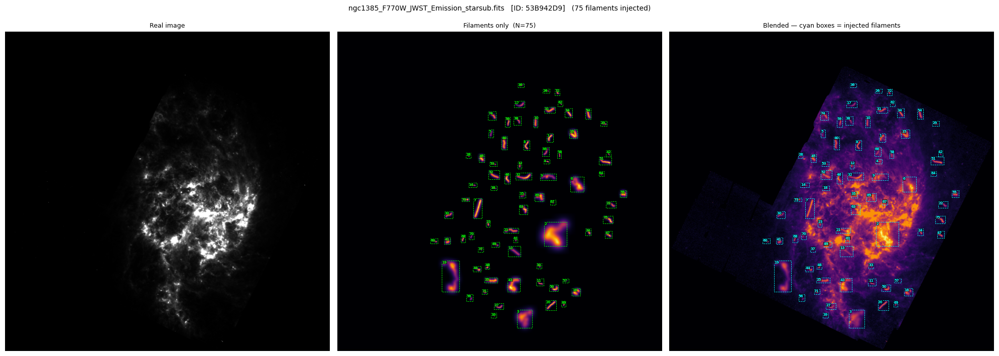


Processing: ngc1433_F770W_JWST_Emission_starsub.fits  ->  ngc1433_F770W_JWST_Emission_starsub_modified_ADFC8E87.fits
  [ADFC8E87] shape=(2453, 2625), masked=4347746 px, valid=2,091,379 px
  [ADFC8E87] placed 75 / 75 requested (tried 415 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc1433_F770W_JWST_Emission_starsub_modified_ADFC8E87.fits


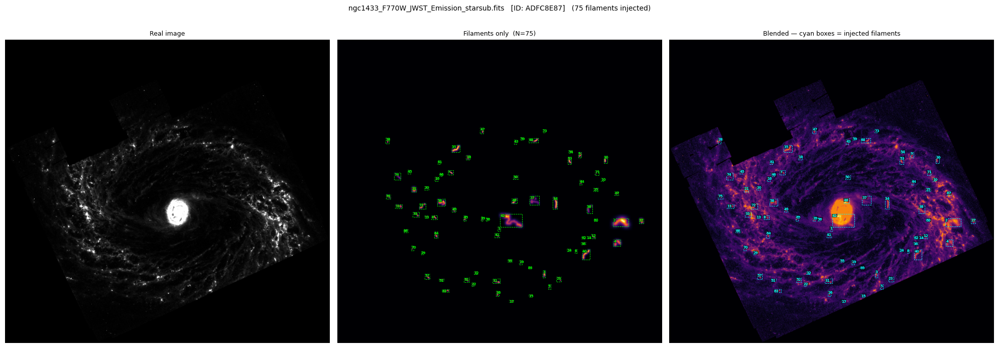


Processing: ngc1512_F770W_JWST_Emission_starsub.fits  ->  ngc1512_F770W_JWST_Emission_starsub_modified_9D0E4C21.fits
  [9D0E4C21] shape=(2201, 2446), masked=3927023 px, valid=1,456,623 px
  [9D0E4C21] placed 75 / 75 requested (tried 368 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc1512_F770W_JWST_Emission_starsub_modified_9D0E4C21.fits


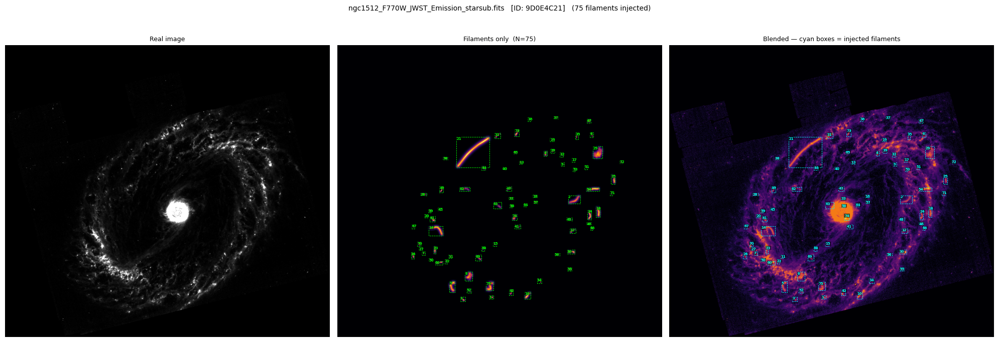


Processing: ngc1566_F770W_JWST_Emission_starsub.fits  ->  ngc1566_F770W_JWST_Emission_starsub_modified_FB75D406.fits
  [FB75D406] shape=(2125, 1814), masked=1127933 px, valid=2,726,817 px
  [FB75D406] placed 75 / 75 requested (tried 346 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc1566_F770W_JWST_Emission_starsub_modified_FB75D406.fits


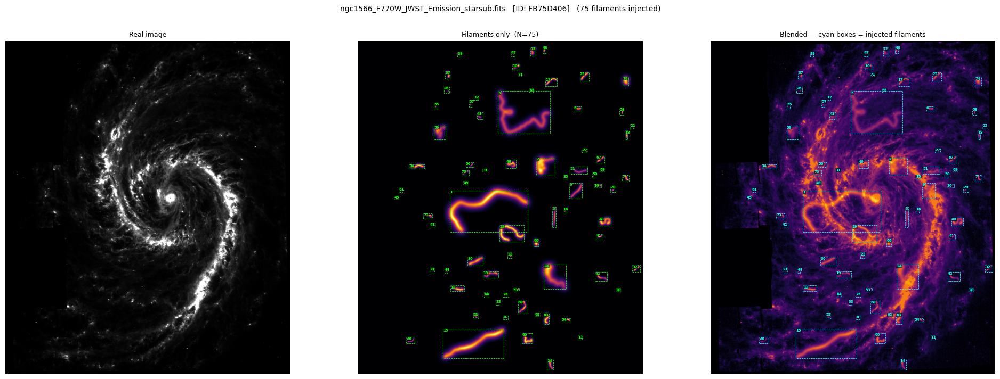


Processing: ngc2090_F555W_HST_Extinction.fits  ->  ngc2090_F555W_HST_Extinction_modified_C8F5370B.fits
  [C8F5370B] shape=(7000, 7000), masked=31550891 px, valid=17,449,109 px
  [C8F5370B] placed 75 / 75 requested (tried 92 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc2090_F555W_HST_Extinction_modified_C8F5370B.fits


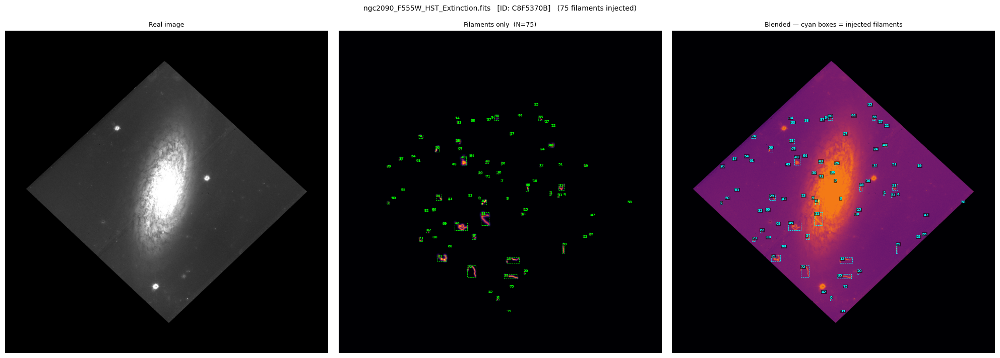


Processing: ngc2835_F770W_JWST_Emission_starsub.fits  ->  ngc2835_F770W_JWST_Emission_starsub_modified_ABDFD744.fits
  [ABDFD744] shape=(2034, 1611), masked=1814236 px, valid=1,462,538 px
  [ABDFD744] placed 75 / 75 requested (tried 435 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc2835_F770W_JWST_Emission_starsub_modified_ABDFD744.fits


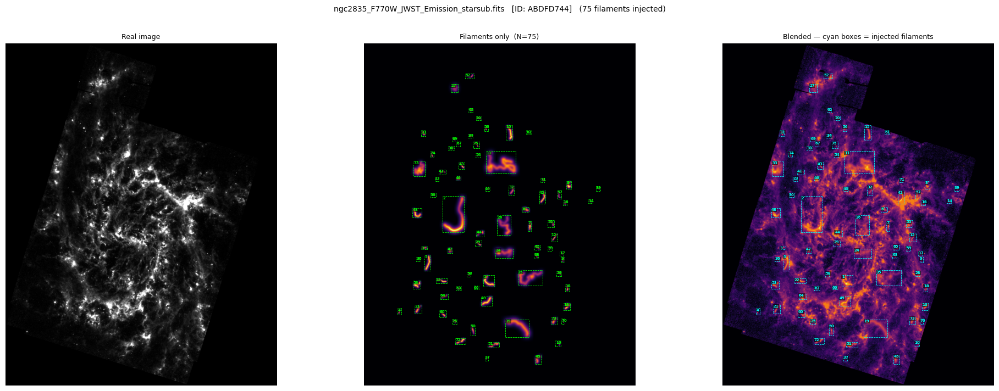


Processing: ngc3351_F770W_JWST_Emission_starsub.fits  ->  ngc3351_F770W_JWST_Emission_starsub_modified_A86C448A.fits
  [A86C448A] shape=(2576, 2665), masked=4465349 px, valid=2,399,691 px
  [A86C448A] placed 75 / 75 requested (tried 411 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc3351_F770W_JWST_Emission_starsub_modified_A86C448A.fits


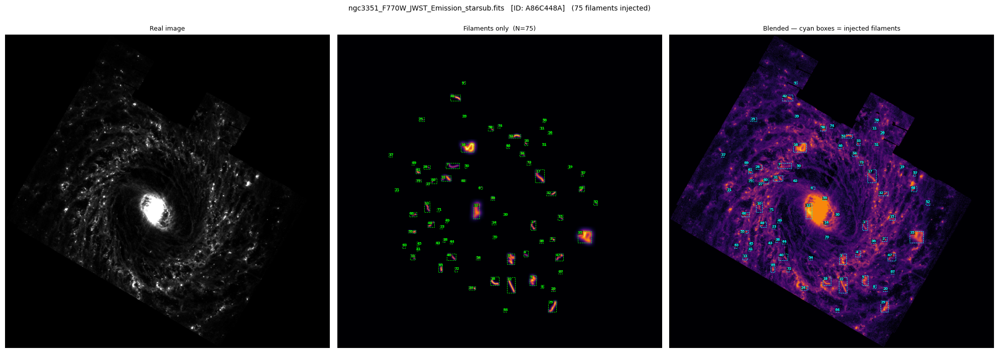


Processing: ngc3627_F770W_JWST_Emission_starsub.fits  ->  ngc3627_F770W_JWST_Emission_starsub_modified_C3124544.fits
  [C3124544] shape=(2683, 1959), masked=2801203 px, valid=2,454,794 px
  [C3124544] placed 75 / 75 requested (tried 234 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc3627_F770W_JWST_Emission_starsub_modified_C3124544.fits


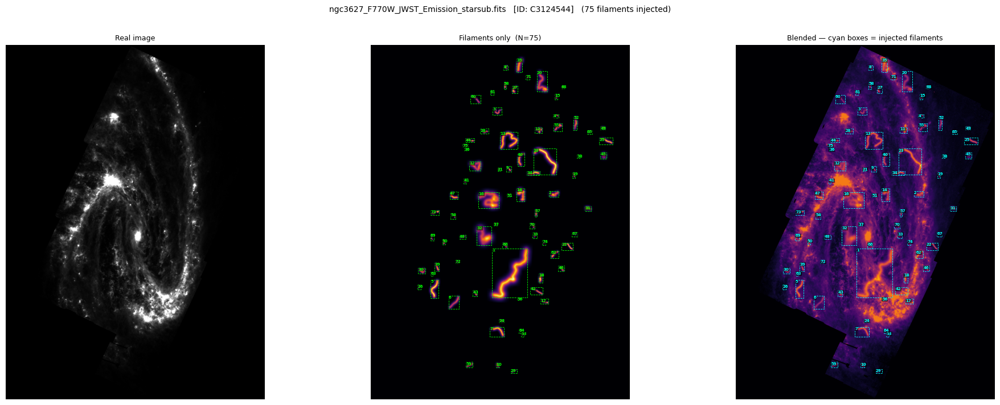


Processing: ngc4254_F770W_JWST_Emission_starsub.fits  ->  ngc4254_F770W_JWST_Emission_starsub_modified_E5AB32B0.fits
  [E5AB32B0] shape=(2630, 2184), masked=3428090 px, valid=2,315,830 px
  [E5AB32B0] placed 75 / 75 requested (tried 221 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc4254_F770W_JWST_Emission_starsub_modified_E5AB32B0.fits


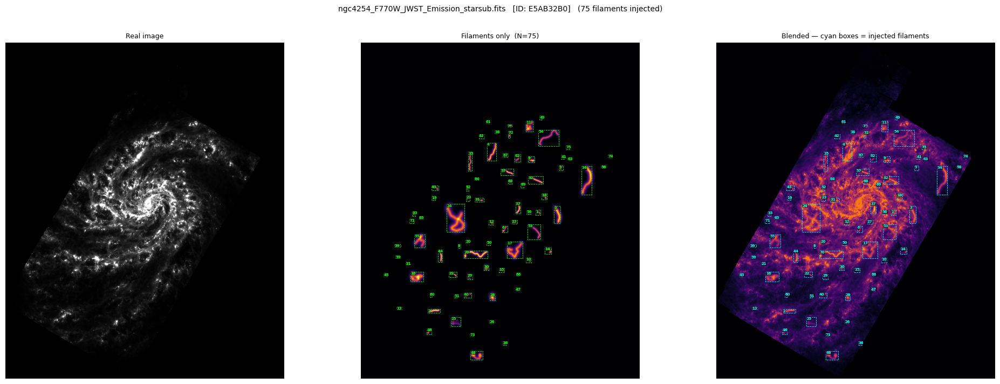


Processing: ngc4303_F770W_JWST_Emission_starsub.fits  ->  ngc4303_F770W_JWST_Emission_starsub_modified_13BDBF14.fits
  [13BDBF14] shape=(2467, 2600), masked=3390378 px, valid=3,023,822 px
  [13BDBF14] placed 75 / 75 requested (tried 194 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc4303_F770W_JWST_Emission_starsub_modified_13BDBF14.fits


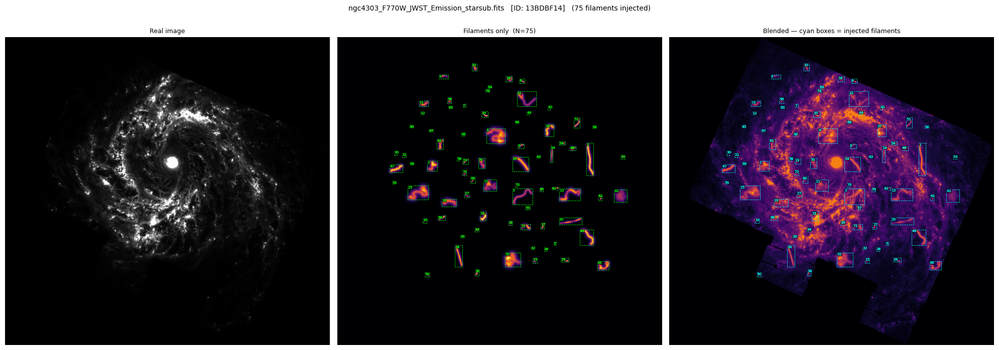


Processing: ngc4321_F770W_JWST_Emission_starsub.fits  ->  ngc4321_F770W_JWST_Emission_starsub_modified_C7F1D91B.fits
  [C7F1D91B] shape=(2391, 2548), masked=2970120 px, valid=3,122,148 px
  [C7F1D91B] placed 75 / 75 requested (tried 210 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc4321_F770W_JWST_Emission_starsub_modified_C7F1D91B.fits


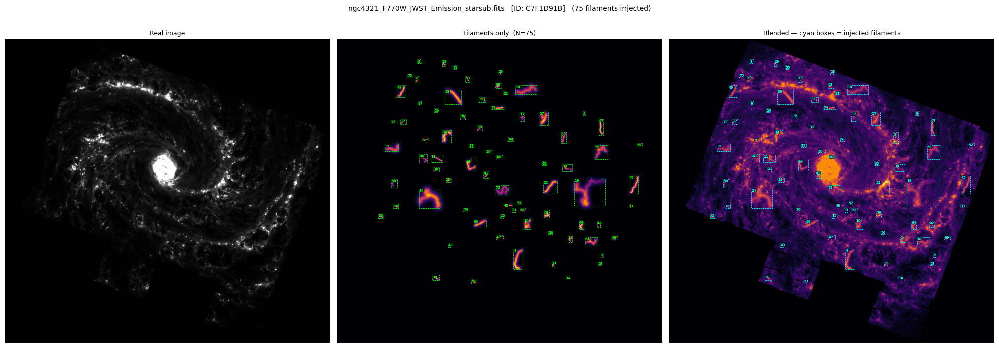


Processing: ngc4535_F770W_JWST_Emission_starsub.fits  ->  ngc4535_F770W_JWST_Emission_starsub_modified_AC0BE4B1.fits
  [AC0BE4B1] shape=(2062, 1679), masked=1757980 px, valid=1,704,118 px
  [AC0BE4B1] placed 75 / 75 requested (tried 350 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc4535_F770W_JWST_Emission_starsub_modified_AC0BE4B1.fits


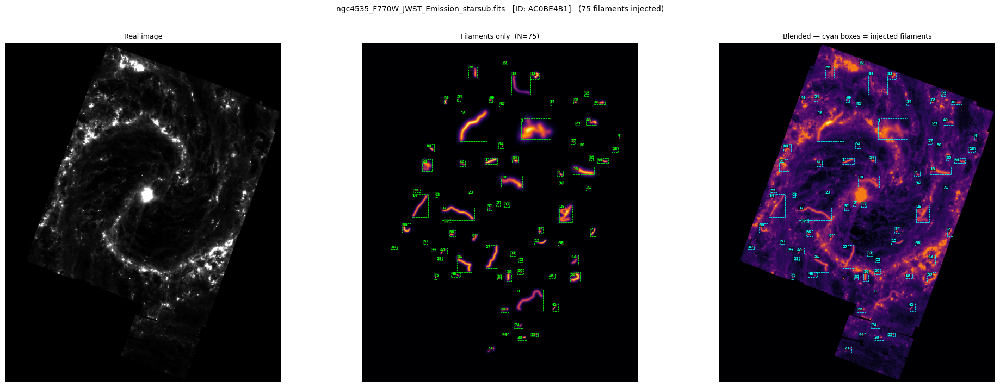


Processing: ngc5068_F770W_JWST_Emission_starsub.fits  ->  ngc5068_F770W_JWST_Emission_starsub_modified_4AFECDBF.fits
  [4AFECDBF] shape=(2699, 2705), masked=4964311 px, valid=2,336,484 px
  [4AFECDBF] placed 75 / 75 requested (tried 276 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc5068_F770W_JWST_Emission_starsub_modified_4AFECDBF.fits


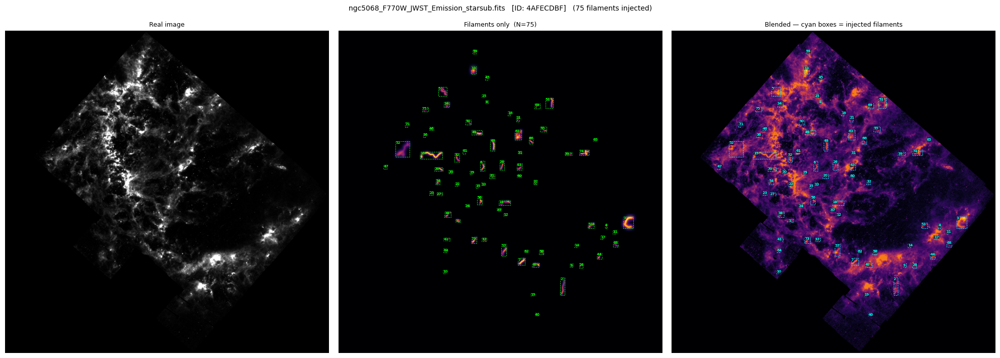


Processing: ngc7496_F770W_JWST_Emission_starsub.fits  ->  ngc7496_F770W_JWST_Emission_starsub_modified_743F04C2.fits
  [743F04C2] shape=(1896, 1349), masked=1360205 px, valid=1,197,499 px
  [743F04C2] placed 75 / 75 requested (tried 472 pool entries).
  Saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages\ngc7496_F770W_JWST_Emission_starsub_modified_743F04C2.fits


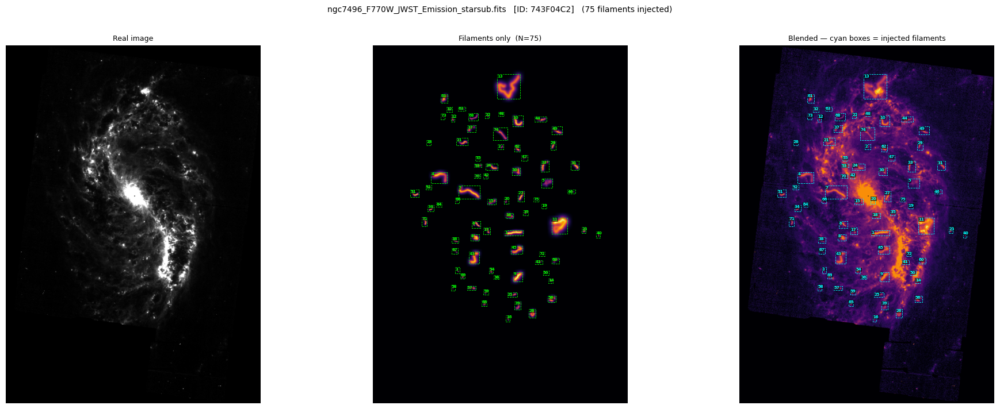


Catalog saved -> C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\filament_catalog.csv  (1500 rows across 20 image(s))
image_id  label  length  width  profile  tortuosity  injected_flux
DD8F6885      1      19   3.17   linear       1.034       164.9858
DD8F6885      2     143   9.82     sin2       3.201      3096.8813
DD8F6885      3     402  12.96      sin       4.189      3394.0457
DD8F6885      4      32   3.72 gaussian       1.119       419.8808
DD8F6885      5      45   3.63   linear       1.035       297.7590
DD8F6885      6      16   1.64 gaussian       1.477        72.6261
DD8F6885      7     153   6.15     sin2       1.010      2085.5575
DD8F6885      8     263  10.74 gaussian       1.070      6392.4879
DD8F6885      9     117   8.70      sin       1.202      1697.5947
DD8F6885     10      35   2.97 gaussian       1.108       182.6830
DD8F6885     11     200  20.00   linear       1.595     10625.0002
DD8F6885     12     498  15.22   linear      28.402      7574.8680
DD8F

In [32]:
# ── User parameters ────────────────────────────────────────────────────────────
INPUT_FOLDER       = r"C:\Users\jhoffm72\Documents\FilPHANGS\Data\OriginalImages"
OUTPUT_FOLDER      = r"C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data\OriginalImages"
N_INJECT           = 75    # n  — filaments to place per image
N_POOL             = 1000   # N  — total filaments generated up-front; n drawn per image
RANDOM_SEED_INJECT = 7
BLEND_SCALE        = 1.0    # scale applied to filament canvas before blending
CATALOG_CSV        = 'filament_catalog.csv'  # saved inside OUTPUT_FOLDER

# ── Imports ───────────────────────────────────────────────────────────────────
import os, copy, uuid
import cv2
import pandas as pd
import matplotlib.patches as mpatches
from astropy.io import fits

os.makedirs(OUTPUT_FOLDER, exist_ok=True)

# ── Collect FITS files ────────────────────────────────────────────────────────
fits_files = sorted([
    f for f in os.listdir(INPUT_FOLDER)
    if f.lower().endswith(('.fits', '.fit'))
])
if not fits_files:
    raise FileNotFoundError(f"No FITS files found in {INPUT_FOLDER!r}")
print(f"Found {len(fits_files)} FITS file(s): {fits_files}")

# ── Pre-generate pool of N filament parameter sets ────────────────────────────
rng_pool = np.random.default_rng(RANDOM_SEED_INJECT)

pool = []
for _ in range(N_POOL):
    length, width = sample_length_width(rng_pool)
    i_lo = float(rng_pool.uniform(INTENSITY_MIN, INTENSITY_MAX))
    pool.append(dict(
        length   = length,
        width    = width,
        curv     = float(rng_pool.uniform(CURVATURE_MIN, CURVATURE_MAX)),
        i_lo     = i_lo,
        i_hi     = float(rng_pool.uniform(i_lo, INTENSITY_MAX)),
        profile  = rng_pool.choice(INTENSITY_PROFILES),
        angle    = float(rng_pool.uniform(0, 2 * np.pi)),
        seed     = int(rng_pool.integers(0, 2**31)),
    ))
print(f"Pre-generated pool of {N_POOL} filament parameter sets.")

# ── Helper: build placement mask ─────────────────────────────────────────────
def build_mask(data):
    threshold = 1e-20
    kernel    = np.ones((3, 3), np.uint8)

    mc = copy.deepcopy(data).astype(np.float32)
    mc[mc > threshold] = 255
    mc = mc.astype(np.uint8)
    dil = cv2.dilate(mc, kernel, iterations=5)

    tmp = copy.deepcopy(data).astype(np.float32)
    tmp[dil < threshold] = np.nan
    mask = np.isnan(tmp)

    bm = np.zeros_like(tmp, dtype=np.uint8)
    bm[mask]  = 255
    bm[~mask] = 0
    bm2 = cv2.dilate(bm, kernel, iterations=1)

    tmp2 = copy.deepcopy(data).astype(np.float32)
    tmp2[bm2 == 255] = np.nan
    return np.isnan(tmp2)

# ── Helper: vectorised footprint ─────────────────────────────────────────────
def get_footprint(path, width, img_rows, img_cols):
    """
    Return boolean mask of shape (img_rows, img_cols) covering the full
    Gaussian support of the filament.  Pure NumPy — no Python loops over pixels.
    """
    hw      = int(np.ceil(4 * width))
    pr      = np.round(path[:, 0]).astype(int)
    pc      = np.round(path[:, 1]).astype(int)
    offsets = np.arange(-hw, hw + 1)
    dr, dc  = np.meshgrid(offsets, offsets, indexing='ij')  # (2hw+1, 2hw+1)
    dr      = dr.ravel(); dc = dc.ravel()                   # flatten offset grid

    # Broadcast: (n_path_pts, n_offsets)
    all_r = (pr[:, None] + dr[None, :]).ravel()
    all_c = (pc[:, None] + dc[None, :]).ravel()

    # Clip to image bounds
    valid = (all_r >= 0) & (all_r < img_rows) & (all_c >= 0) & (all_c < img_cols)
    fp    = np.zeros((img_rows, img_cols), dtype=bool)
    fp[all_r[valid], all_c[valid]] = True
    return fp

# ── Helper: inject filaments into one image ───────────────────────────────────
def inject_into_image(data, pool, n_inject, rng, image_id):
    img_rows, img_cols = data.shape
    mask = build_mask(data)
    valid_rows, valid_cols = np.where(~mask)
    print(f"  [{image_id}] shape={data.shape}, "
          f"masked={mask.sum()} px, valid={len(valid_rows):,} px")

    filament_canvas = np.zeros((img_rows, img_cols), dtype=np.float64)
    occupied        = np.zeros((img_rows, img_cols), dtype=bool)
    catalog_rows    = []

    pool_order = rng.permutation(N_POOL).tolist()
    placed     = 0
    pool_idx   = 0

    while placed < n_inject and pool_idx < N_POOL:
        p = pool[pool_order[pool_idx]]
        pool_idx += 1

        if len(valid_rows) == 0:
            break
        si    = int(rng.integers(0, len(valid_rows)))
        start = (float(valid_rows[si]), float(valid_cols[si]))

        np.random.seed(p['seed'])
        path = random_walk_path(start, p['angle'], p['length'], p['curv'])

        pr = np.round(path[:, 0]).astype(int)
        pc = np.round(path[:, 1]).astype(int)
        in_bounds = (pr >= 0) & (pr < img_rows) & (pc >= 0) & (pc < img_cols)
        if not in_bounds.all():
            continue
        if mask[pr, pc].any():
            continue

        # Vectorised footprint — replaces the triple Python loop
        fp = get_footprint(path, p['width'], img_rows, img_cols)
        if occupied[fp].any():
            continue

        # Commit
        occupied |= fp
        t                = np.linspace(0.0, 1.0, len(path))
        intensity_values = PROFILE_MAP[p['profile']](t, p['i_lo'], p['i_hi'])
        # Render onto a small temporary canvas, scale so peak == i_hi,
        # then add smoothly to the main filament canvas with +=.
        # Using a separate tmp canvas (not filament_canvas directly) keeps
        # the scaling independent and avoids the blocky footprint artefact.
        fil_tmp = np.zeros((img_rows, img_cols), dtype=np.float64)
        render_filament(fil_tmp, path, p['width'], intensity_values)
        tmp_max = fil_tmp.max()
        if tmp_max > 0:
            fil_tmp *= (p['i_hi'] / tmp_max)   # scale so peak == i_hi
        filament_canvas += fil_tmp

        # Measure injected flux inside the footprint on this filament's canvas
        injected_flux = round(float(np.nansum(fil_tmp[fp])), 4)

        placed += 1
        catalog_rows.append({
            'image_id':   image_id,
            'label':      placed,
            'length':     p['length'],
            'width':      round(p['width'], 2),
            'tortuosity': round(measure_tortuosity(path), 3),
            'profile':    p['profile'],
            'i_lo':       round(p['i_lo'], 3),
            'i_hi':       round(p['i_hi'], 3),
            'injected_flux': injected_flux,
            'path_r':     ';'.join(f'{v:.2f}' for v in path[:, 0].tolist()),
            'path_c':     ';'.join(f'{v:.2f}' for v in path[:, 1].tolist()),
        })

    print(f"  [{image_id}] placed {placed} / {n_inject} requested "
          f"(tried {pool_idx} pool entries).")
    return filament_canvas, catalog_rows

# ── Helper: draw bounding boxes + labels on an Axes ──────────────────────────
def annotate_filaments(ax, catalog_rows, pad=6, box_color='lime', fontsize=5):
    for row in catalog_rows:
        rs = np.array([float(v) for v in row['path_r'].split(';')])
        cs = np.array([float(v) for v in row['path_c'].split(';')])
        r_min, r_max = rs.min() - pad, rs.max() + pad
        c_min, c_max = cs.min() - pad, cs.max() + pad
        rect = mpatches.Rectangle(
            (c_min, r_min), c_max - c_min, r_max - r_min,
            linewidth=0.6, edgecolor=box_color, facecolor='none', linestyle='--'
        )
        ax.add_patch(rect)
        ax.text(
            c_min + 1, r_min + 1, str(row['label']),
            color=box_color, fontsize=fontsize, va='top', ha='left', fontweight='bold',
            bbox=dict(boxstyle='square,pad=0.1', fc='black', ec='none', alpha=0.55),
        )

# ── Main loop: process every FITS file ───────────────────────────────────────
rng_main    = np.random.default_rng(RANDOM_SEED_INJECT + 1)
all_catalog = []

for fits_fname in fits_files:
    fits_path = os.path.join(INPUT_FOLDER, fits_fname)
    base_name = os.path.splitext(fits_fname)[0]
    image_id  = str(uuid.uuid4())[:8].upper()
    out_fname = f"{base_name}_modified_{image_id}.fits"
    out_path  = os.path.join(OUTPUT_FOLDER, out_fname)
    print(f"\nProcessing: {fits_fname}  ->  {out_fname}")

    hdul    = fits.open(fits_path)
    hdu_idx = None
    for i, hdu in enumerate(hdul):
        if hdu.data is not None and hdu.data.ndim >= 2:
            hdu_idx = i
            break
    if hdu_idx is None:
        print(f"  WARNING: no 2-D data found in {fits_fname}, skipping.")
        hdul.close()
        continue

    data = np.squeeze(hdul[hdu_idx].data).astype(np.float64)
    hdul.close()

    filament_canvas, catalog_rows = inject_into_image(
        data, pool, N_INJECT, rng_main, image_id
    )

    valid_pixels = data[~np.isnan(data)]
    data_std     = float(np.std(valid_pixels)) if len(valid_pixels) else 1.0
    fil_max      = filament_canvas.max()
    injection    = BLEND_SCALE * filament_canvas
    blended_data = data + injection

    # ── Save output FITS ───────────────────────────────────────────────────────
    out_hdul   = fits.open(fits_path)
    orig_dtype = out_hdul[hdu_idx].data.dtype
    out_hdul[hdu_idx].data = blended_data.reshape(
        out_hdul[hdu_idx].data.shape
    ).astype(orig_dtype)
    out_hdul[hdu_idx].header['IMG_ID'] = (image_id,          'Synthetic injection run ID')
    out_hdul[hdu_idx].header['N_FILS'] = (len(catalog_rows),  'Number of injected filaments')
    out_hdul[hdu_idx].header['ORIG']   = (fits_fname,         'Original filename')
    out_hdul.writeto(out_path, overwrite=True)
    out_hdul.close()
    print(f"  Saved -> {out_path}")

    all_catalog.extend(catalog_rows)

    # ── Diagnostic plot ────────────────────────────────────────────────────────
    valid_mask   = ~np.isnan(data)
    lo_p, hi_p   = np.nanpercentile(data[valid_mask], [1, 99])
    display_real = np.clip(
        (np.nan_to_num(data, nan=0.0) - lo_p) / (hi_p - lo_p + 1e-30), 0, 1
    )
    blended_disp = display_real + BLEND_SCALE * filament_canvas / (fil_max + 1e-30)

    fig, axes = plt.subplots(1, 3, figsize=(20, 7))
    fig.suptitle(
        f'{fits_fname}   [ID: {image_id}]   ({len(catalog_rows)} filaments injected)',
        fontsize=10, y=1.01,
    )
    axes[0].imshow(display_real, origin='upper', cmap='gray', vmin=0, vmax=1)
    axes[0].set_title('Real image', fontsize=9)
    axes[0].axis('off')

    axes[1].imshow(filament_canvas, origin='upper', cmap='inferno',
                   norm=mcolors.PowerNorm(gamma=0.5, vmin=0, vmax=max(fil_max, 1e-6)))
    annotate_filaments(axes[1], catalog_rows, pad=8, box_color='lime', fontsize=5)
    axes[1].set_title(f'Filaments only  (N={len(catalog_rows)})', fontsize=9)
    axes[1].axis('off')

    axes[2].imshow(blended_disp, origin='upper', cmap='inferno',
                   norm=mcolors.PowerNorm(gamma=0.5, vmin=0, vmax=max(blended_disp.max(), 1e-6)))
    annotate_filaments(axes[2], catalog_rows, pad=8, box_color='cyan', fontsize=5)
    axes[2].set_title('Blended — cyan boxes = injected filaments', fontsize=9)
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# ── Save combined catalog ─────────────────────────────────────────────────────
catalog_path = os.path.join(r"C:\Users\jhoffm72\Documents\FilPHANGS\Validation_Data", CATALOG_CSV)
catalog_df   = pd.DataFrame(all_catalog)
catalog_df.to_csv(catalog_path, index=False)
print(f"\nCatalog saved -> {catalog_path}  ({len(catalog_df)} rows across {len(fits_files)} image(s))")
print(catalog_df[['image_id','label','length','width','profile','tortuosity','injected_flux']].to_string(index=False))